In [1]:
# Process
import pandas as pd
import numpy as np
import geopandas
import shapely.wkt
import folium
import mysql.connector
import json

# Set env
import os
os.environ["USE_PYGEOS"] = "0"
import contextily as cx

In [2]:
df = pd.read_csv('./POINT_20181024_1.csv')

In [3]:
# หัว
df.head()

,OPERATION_TYPE,SITE_CELL_ID,SITE_ID,CELL_STATUS,UTILIZATION_PEAK_TIME,LATITUDE,LONGITUDE
0,I,909664.0,429371.0,ACTIVE,23/10/2018 17:00,13.42507,99.955180
1,I,909665.0,429371.0,ACTIVE,23/10/2018 16:00,13.42507,99.955180
2,I,909666.0,429371.0,ACTIVE,23/10/2018 17:00,13.42507,99.955180
3,I,909671.0,429372.0,ACTIVE,23/10/2018 19:00,13.42537,99.954059
4,I,909672.0,429372.0,ACTIVE,23/10/2018 10:00,13.42537,99.954059


In [4]:
# หาง
df.tail()

,OPERATION_TYPE,SITE_CELL_ID,SITE_ID,CELL_STATUS,UTILIZATION_PEAK_TIME,LATITUDE,LONGITUDE
38114,I,916011.0,495781.0,ACTIVE,NaN,5.983300,101.780900
38115,I,915365.0,495623.0,ACTIVE,NaN,13.753514,100.541077
38116,I,915366.0,495623.0,ACTIVE,NaN,13.753514,100.541077
38117,I,915367.0,495623.0,ACTIVE,NaN,13.753514,100.541077
38118,38118,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
df.shape

(38119, 7)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38119 entries, 0 to 38118
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   OPERATION_TYPE         38119 non-null  object 
 1   SITE_CELL_ID           38118 non-null  float64
 2   SITE_ID                38118 non-null  float64
 3   CELL_STATUS            38118 non-null  object 
 4   UTILIZATION_PEAK_TIME  2144 non-null   object 
 5   LATITUDE               38118 non-null  float64
 6   LONGITUDE              38118 non-null  float64
dtypes: float64(4), object(3)
memory usage: 2.0+ MB


array([[<Axes: title={'center': 'SITE_CELL_ID'}>,
        <Axes: title={'center': 'SITE_ID'}>],
       [<Axes: title={'center': 'LATITUDE'}>,
        <Axes: title={'center': 'LONGITUDE'}>]], dtype=object)

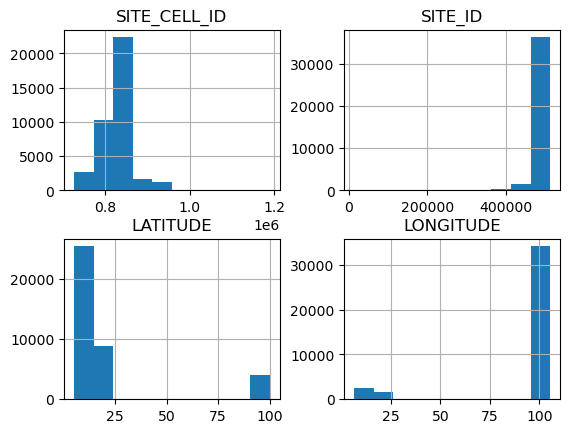

In [7]:
df.hist()

In [8]:
df.describe()

,SITE_CELL_ID,SITE_ID,LATITUDE,LONGITUDE
count,3.811800e+04,38118.000000,38118.000000,38118.000000
mean,8.305706e+05,471155.042159,22.891080,91.773989
std,3.779074e+04,10903.350917,26.208496,27.146992
min,7.273000e+05,14333.000000,5.230000,6.490470
25%,8.134172e+05,468299.000000,13.670670,100.422731
50%,8.374365e+05,473483.000000,13.856475,100.609424
75%,8.500368e+05,476370.750000,15.494410,101.067160
max,1.189442e+06,512669.000000,99.998365,105.466420


In [9]:
df['LATITUDE'].isnull()

0        False
1        False
2        False
3        False
4        False
         ...  
38114    False
38115    False
38116    False
38117    False
38118     True
Name: LATITUDE, Length: 38119, dtype: bool

In [10]:
df['LONGITUDE'].isnull()

0        False
1        False
2        False
3        False
4        False
         ...  
38114    False
38115    False
38116    False
38117    False
38118     True
Name: LONGITUDE, Length: 38119, dtype: bool

In [11]:
# ลบแถวที่ latitude,longitude เป็น Nan
df = df.dropna(subset=['LATITUDE','LONGITUDE'],axis='rows')

In [12]:
# Check categories
df['CELL_STATUS'].value_counts()

CELL_STATUS
ACTIVE       36111
DEACTIVE      2003
XACTIVE          2
XDEACTIVE        2
Name: count, dtype: int64

In [13]:
# Get index of CELL_STATUS is warning
dfs = df[((df['CELL_STATUS'] != 'ACTIVE') & (df['CELL_STATUS'] != 'DEACTIVE'))]
dfs.head()

,OPERATION_TYPE,SITE_CELL_ID,SITE_ID,CELL_STATUS,UTILIZATION_PEAK_TIME,LATITUDE,LONGITUDE
5,I,909673.0,429372.0,XACTIVE,23/10/2018 16:00,13.425370,99.954059
24,I,915607.0,404617.0,XACTIVE,23/10/2018 11:00,13.711807,100.584305
52,I,915649.0,431499.0,XDEACTIVE,NaN,13.766166,100.642703
159,I,915546.0,397828.0,XDEACTIVE,NaN,13.696351,100.753258


In [14]:
# find to set
df.loc[dfs.index,'CELL_STATUS'] = 'DEACTIVE'

In [15]:
# view after set
df.iloc[dfs.index]

,OPERATION_TYPE,SITE_CELL_ID,SITE_ID,CELL_STATUS,UTILIZATION_PEAK_TIME,LATITUDE,LONGITUDE
5,I,909673.0,429372.0,DEACTIVE,23/10/2018 16:00,13.425370,99.954059
24,I,915607.0,404617.0,DEACTIVE,23/10/2018 11:00,13.711807,100.584305
52,I,915649.0,431499.0,DEACTIVE,NaN,13.766166,100.642703
159,I,915546.0,397828.0,DEACTIVE,NaN,13.696351,100.753258


In [16]:
# transform column geometry
df['geometry'] = df[['LATITUDE','LONGITUDE']].apply(lambda row: 'POINT (' + row['LONGITUDE'].astype(str) + ' ' + row['LATITUDE'].astype(str) + ')',axis=1)

In [17]:
df.head()

,OPERATION_TYPE,SITE_CELL_ID,SITE_ID,CELL_STATUS,UTILIZATION_PEAK_TIME,LATITUDE,LONGITUDE,geometry
0,I,909664.0,429371.0,ACTIVE,23/10/2018 17:00,13.42507,99.955180,POINT (99.95518 13.42507)
1,I,909665.0,429371.0,ACTIVE,23/10/2018 16:00,13.42507,99.955180,POINT (99.95518 13.42507)
2,I,909666.0,429371.0,ACTIVE,23/10/2018 17:00,13.42507,99.955180,POINT (99.95518 13.42507)
3,I,909671.0,429372.0,ACTIVE,23/10/2018 19:00,13.42537,99.954059,POINT (99.954059 13.42537)
4,I,909672.0,429372.0,ACTIVE,23/10/2018 10:00,13.42537,99.954059,POINT (99.954059 13.42537)


In [18]:
# convert dataframe to geo dataframe
locations = geopandas.GeoDataFrame(df, geometry=df['geometry'].apply(shapely.wkt.loads),crs='epsg:4326')

In [19]:
locations.shape

(38118, 8)

In [20]:
map_1 = folium.Map(zoom_start=15,control_scale = True,crs='epsg:4326')

In [21]:
# plot data
locations.explore()

In [22]:
# load geometry json จังหวัด เพชรบุรี
with open('./petchaburi.json','r',encoding='utf8') as f:
    province = json.load(f)
    f.close()

print(province)

{'type': 'FeatureCollection', 'features': [{'type': 'Feature', 'properties': {'OBJECTID': 1350, 'CHANGWAT_NAME': 'เพชรบุรี', 'CHANGWAT_NAMEE': 'PETCHABURI', 'CREATIONUSER': '4419', 'DATECREATED': 1275609600000, 'LASTUSER': '800000', 'DATEMODIFIED': 1444348800000, 'WORKREQUESTID': None, 'DESIGNID': ' ', 'WORKLOCATIONID': None, 'WORKFLOWSTATUS': None, 'WORKFUNCTION': None, 'SHAPE.AREA': 6107444841.07569, 'SHAPE.LEN': 426810.422341067, 'PROV_CODE': '76', 'GLOBALID': '{732EB8AC-2FA1-4D95-8C73-206AA0062E6F}'}, 'geometry': {'type': 'Polygon', 'coordinates': [[[99.75118580301208, 13.341651782963531], [99.75181328986845, 13.340850579472255], [99.75225343278277, 13.341107413084975], [99.75348373130964, 13.341146787971605], [99.7588328764087, 13.339997896749209], [99.75885645342994, 13.33997894793157], [99.75893695596179, 13.339914224361774], [99.75908518409412, 13.33989765100933], [99.75925761484146, 13.33992944847536], [99.75934344684336, 13.339945275980932], [99.7598038252543, 13.340030937772

In [23]:
# create polygon petchaburi
petchaburi = geopandas.GeoDataFrame.from_features(province['features'],crs=4326)

In [ ]:
point_in_polygon = geopandas.sjoin(locations,petchaburi,op='within',how='inner')

In [25]:
location_within_petchaburi = locations.loc[point_in_polygon.index]

In [26]:
location_within_petchaburi.shape

(62, 8)

In [27]:
location_within_petchaburi.explore()

In [28]:
# connection
conn = mysql.connector.connect(host="localhost",user="root",password="",database="final")

In [29]:
if conn.is_connected():
    print('Connected Successfully')
else:
    print('Failed to Connect') 

Connected Successfully


In [30]:
cursor = conn.cursor()

In [31]:
truncate_stmt = 'TRUNCATE TABLE location'
cursor.execute(truncate_stmt) 

In [32]:
for index in location_within_petchaburi.index:
    insert_stmt = 'INSERT INTO location (CELL_STATUS,LATITUDE,LONGITUDE) VALUES (%s,%s,%s)'
    val = (str(location_within_petchaburi.loc[index].CELL_STATUS),float(location_within_petchaburi.loc[index].LATITUDE),float(location_within_petchaburi.loc[index].LONGITUDE))
    cursor.execute(insert_stmt,val)
    conn.commit()

In [33]:
# write folder
if not os.path.exists('./logs'):
    os.makedirs('./logs')
    
# write stats
content = str('{ "stats_within": ' + str(location_within_petchaburi.shape[0]) + ', "stats_not_within": ' + str(locations.shape[0] - location_within_petchaburi.shape[0]) + ' }')
f = open('./logs/stats.json', 'wb')
f.write(bytes(content,encoding='utf8'))
f.close()

In [34]:
print('Done.')

Done.
